# **Klasifikasi Gambar Umur Simpan Buah**

# **Import Libary yang dibutuhkan**

In [1]:
!pip install tensorflowjs


In [26]:
# Mengimpor libraries umum yang sering digunakan
import os, shutil, json
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq
from tqdm import tqdm


# Mengimpor libraries untuk visualisasi
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# Mengimpor libraries untuk pemrosesan data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

# Mengimpor libraries untuk pembuatan dan evaluasi model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau
import tensorflowjs as tfjs

# Mengabaikan peringatan
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
#Untuk Mengambil data dari kaggle
!pip -q install kaggle --upgrade

# **Data Loading**

In [ ]:
# Mengambil dari dari kaggle (menggunakan kredensial API Kaggle)
from google.colab import files
files.upload()

## Dataset

The dataset used in this project is obtained from Kaggle:

https://www.kaggle.com/datasets/ryandpark/fruit-quality-classification

Due to authentication and licensing requirements, the dataset is not automatically downloaded in this notebook.
Please download the dataset manually from Kaggle and place it in the appropriate directory before running the notebook.


In [6]:

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [7]:
# Download dan unzip dataset
DATASET = "ryandpark/fruit-quality-classification"
!kaggle datasets download -d {DATASET}
!rm -rf dataset  # hapus folder lama
!unzip -q *.zip -d dataset


Dataset URL: https://www.kaggle.com/datasets/ryandpark/fruit-quality-classification
License(s): CC0-1.0
 99% 3.01G/3.03G [00:37<00:00, 260MB/s]
100% 3.03G/3.03G [00:37<00:00, 85.8MB/s]


# **Penggabungan Gambar**

In [8]:
# Direktori awal
train_dir = Path("dataset")
test_dir  = Path("dataset")

# Direktori gabungan
combined_dir = Path("combined_dataset")

# Bersihkan jika sudah ada folder lama
if combined_dir.exists():
    shutil.rmtree(combined_dir)
combined_dir.mkdir(parents=True, exist_ok=True)

# Gabungkan dataset dari train_dir
for category in os.listdir(train_dir):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, combined_dir / category, dirs_exist_ok=True)

# Gabungkan dataset dari test_dir (jika berbeda dari train_dir)
if test_dir != train_dir:
    for category in os.listdir(test_dir):
        category_dir = os.path.join(test_dir, category)
        if os.path.isdir(category_dir):
            shutil.copytree(category_dir, combined_dir / category, dirs_exist_ok=True)

#Menghitung total gambar
total_imgs = sum(1 for _ in combined_dir.rglob("*") if _.suffix.lower() in {".jpg", ".jpeg", ".png"})
print(f"Total gambar: {total_imgs}")


Total gambar: 19526


# **Plot gambar sampel untuk semua kelas**

Jumlah kelas buah valid: 18
Pomegranate_Good: 5940 gambar
Apple_Good: 1149 gambar
Orange_Good: 1216 gambar
Banana_Good: 1113 gambar
Guava_Good: 1152 gambar
Lime_Good: 1094 gambar
Banana_Bad: 1087 gambar
Pomegranate_Bad: 1187 gambar
Guava_Bad: 1129 gambar
Apple_Bad: 1141 gambar
Lime_Bad: 1085 gambar
Orange_Bad: 1159 gambar
Banana: 285 gambar
Orange: 125 gambar
Guava: 148 gambar
Pomegranate: 125 gambar
Lemon: 278 gambar
Apple: 113 gambar


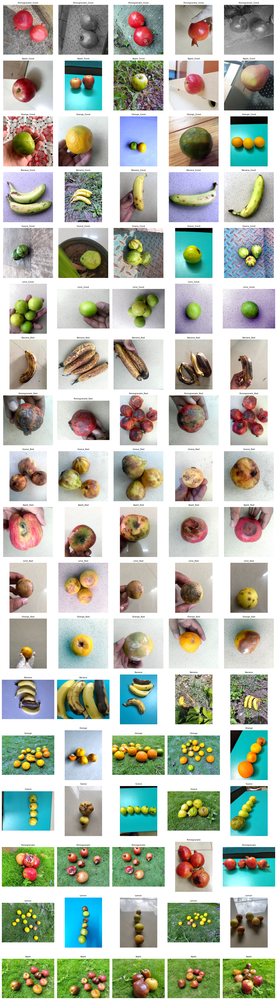

In [9]:
# Define source path
path = Path("combined_dataset")
fruit_image = {}

# Ekstensi file gambar yang diterima
valid_ext = ('.jpg', '.jpeg', '.png', '.jfif', '.bmp', '.webp')

# Mencari semua subfolder yang berisi gambar
for subfolder in path.rglob("*"):
    if subfolder.is_dir():
        imgs = [str(img) for img in subfolder.glob("*") if img.suffix.lower() in valid_ext]
        if len(imgs) > 0:  # hanya masukkan folder yang ada gambarnya
            fruit_image[subfolder.name] = imgs

print(f"Jumlah kelas buah valid: {len(fruit_image)}")
for cls, imgs in fruit_image.items():
    print(f"{cls}: {len(imgs)} gambar")

# Tampilkan 5 gambar acak per kelas
n_classes = len(fruit_image)
if n_classes > 0:
    fig, axs = plt.subplots(n_classes, 5, figsize=(15, 3*n_classes))

    for i, (class_name, img_list) in enumerate(fruit_image.items()):
        if len(img_list) >= 5:
            images = np.random.choice(img_list, 5, replace=False)
        else:
            images = np.random.choice(img_list, 5, replace=True)

        for j, img_path in enumerate(images):
            img = Image.open(img_path).convert("RGB")
            axs[i, j].imshow(img)
            axs[i, j].set_title(class_name, fontsize=8)
            axs[i, j].axis("off")

    plt.tight_layout()
    plt.show()



Jumlah total gambar: 19526
Jumlah kelas: 18

Distribusi gambar per kelas:
labels
Pomegranate_Good    5940
Orange_Good         1216
Pomegranate_Bad     1187
Orange_Bad          1159
Guava_Good          1152
Apple_Good          1149
Apple_Bad           1141
Guava_Bad           1129
Banana_Good         1113
Lime_Good           1094
Banana_Bad          1087
Lime_Bad            1085
Banana               285
Lemon                278
Guava                148
Orange               125
Pomegranate          125
Apple                113
Name: count, dtype: int64


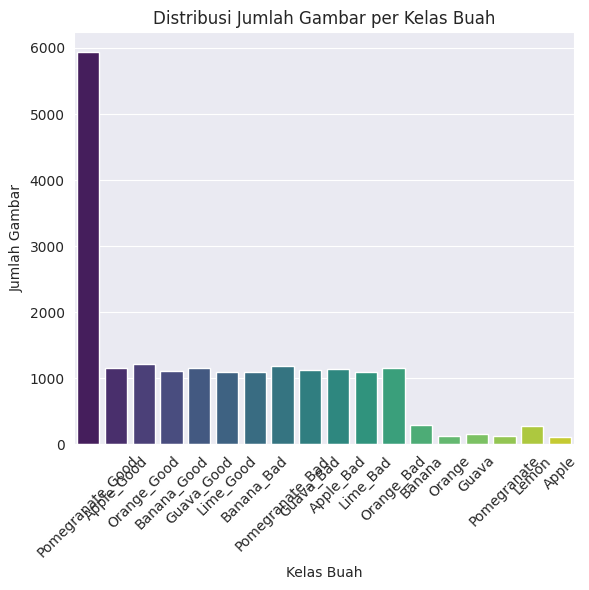

In [10]:
# Untuk memastikan distribusi gambar per kelas seimbang
fruit_path = "combined_dataset"

# Membuat list untuk menyimpan data setiap file
file_name = []
labels = []
full_path = []

# Mengambil data gambar (nama file, path, label) satu per satu dan simpan sebagai DataFrame
valid_ext = ('.jpg', '.jpeg', '.png', '.jfif', '.bmp', '.webp')
for path, subdirs, files in os.walk(fruit_path):
    for name in files:
        if name.lower().endswith(valid_ext):
            full_path.append(os.path.join(path, name))
            labels.append(os.path.basename(path))
            file_name.append(name)

distribution_train = pd.DataFrame({"path": full_path, "file_name": file_name, "labels": labels})

# Menampilkan jumlah total gambar dan kelas
print(f"Jumlah total gambar: {len(distribution_train)}")
print(f"Jumlah kelas: {distribution_train['labels'].nunique()}")
print("\nDistribusi gambar per kelas:")
print(distribution_train['labels'].value_counts())

# Plot distribusi gambar antar kelas
Label = distribution_train['labels']
plt.figure(figsize = (6,6))
sns.set_style("darkgrid")
plot_data = sns.countplot(x=Label, palette="viridis")
plt.title("Distribusi Jumlah Gambar per Kelas Buah")
plt.xlabel("Kelas Buah")
plt.ylabel("Jumlah Gambar")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [11]:
#Untuk Menghapus folder yang memiliki jumlah gambar kecil

# Tentukan path ke direktori train dan test Anda
base_dir = 'fruits-fresh-and-rotten-for-classification/dataset'
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')

# Tuliskan nama folder yang ingin Anda hapus
folders_to_delete = ['Banana', 'Orange', 'Apple', 'Pomegranate', 'Lemon', 'Guava']


print("Memulai proses pembersihan direktori...")

# Proses penghapusan
for dir_path in [train_dir, test_dir]:
    print(f"\nMemeriksa di: {dir_path}")
    for folder_name in folders_to_delete:
        path_to_delete = os.path.join(dir_path, folder_name)

        # Periksa apakah folder tersebut ada sebelum mencoba menghapusnya
        if os.path.exists(path_to_delete):
            print(f"-> Menghapus folder '{folder_name}'...")
            shutil.rmtree(path_to_delete)
        else:
            print(f"-> Folder '{folder_name}' tidak ditemukan.")

print("\nProses pembersihan selesai! ")

Memulai proses pembersihan direktori...

Memeriksa di: fruits-fresh-and-rotten-for-classification/dataset/train
-> Folder 'Banana' tidak ditemukan.
-> Folder 'Orange' tidak ditemukan.
-> Folder 'Apple' tidak ditemukan.
-> Folder 'Pomegranate' tidak ditemukan.
-> Folder 'Lemon' tidak ditemukan.
-> Folder 'Guava' tidak ditemukan.

Memeriksa di: fruits-fresh-and-rotten-for-classification/dataset/test
-> Folder 'Banana' tidak ditemukan.
-> Folder 'Orange' tidak ditemukan.
-> Folder 'Apple' tidak ditemukan.
-> Folder 'Pomegranate' tidak ditemukan.
-> Folder 'Lemon' tidak ditemukan.
-> Folder 'Guava' tidak ditemukan.

Proses pembersihan selesai! 


# **Data Augmentation**

In [12]:
# Rotasi berlawanan arah jarum jam
def anticlockwise_rotation(img):
    img = tf.image.resize(img, (224, 224))
    img = tf.image.rot90(img, k=random.randint(1, 3))  # 90, 180, atau 270 derajat
    return img.numpy()

# Rotasi searah jarum jam
def clockwise_rotation(img):
    img = tf.image.resize(img, (224, 224))
    img = tf.image.rot90(img, k=random.randint(1, 3))
    return img.numpy()

# Flip vertikal (atas-bawah)
def flip_up_down(img):
    img = tf.image.resize(img, (224, 224))
    img = tf.image.flip_up_down(img)
    return img.numpy()

# Penambahan kecerahan
def add_brightness(img):
    img = tf.image.resize(img, (224, 224))
    img = tf.image.adjust_brightness(img, delta=random.uniform(0.1, 0.5))
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy()

# Efek blur sederhana (Gaussian blur)
def blur_image(img):
    img = tf.image.resize(img, (224, 224))
    img = img.numpy().astype(np.uint8)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    return img

# Efek shear (pergeseran melintang)
def sheared(img):
    img = tf.image.resize(img, (224, 224))
    img = img.numpy().astype(np.uint8)
    shear_x = random.uniform(-0.2, 0.2)
    M = np.float32([[1, shear_x, 0], [0, 1, 0]])
    img = cv2.warpAffine(img, M, (224, 224))
    return img

# Pergeseran acak (warp shift)
def warp_shift(img):
    img = tf.image.resize(img, (224, 224))
    img = img.numpy().astype(np.uint8)
    tx = random.uniform(-0.1, 0.1) * 224
    ty = random.uniform(-0.1, 0.1) * 224
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    img = cv2.warpAffine(img, M, (224, 224))
    return img


In [13]:

# Transformasi tetap sama seperti sebelumnya
transformations = {
    'rotate anticlockwise': anticlockwise_rotation,
    'rotate clockwise': clockwise_rotation,
    'warp shift': warp_shift,
    'blurring image': blur_image,
    'add brightness': add_brightness,
    'flip up down': flip_up_down,
    'shear image': sheared
}

#Konfigurasi Path Dataset

images_path = Path("combined_dataset")
augmented_path = Path("combined_dataset/augmented")
augmented_path.mkdir(parents=True, exist_ok=True)

# Mengambil semua gambar sekali saja
valid_ext = (".jpg",".jpeg",".png")
images = [str(p) for p in images_path.rglob("*") if p.suffix.lower() in valid_ext]
print(f"Jumlah gambar ditemukan: {len(images)}")

#Menentukan Jumlah gambar yang akan diAugmentasu
images_to_generate = 2000
selected_images = random.sample(images, k=min(images_to_generate, len(images)))

#Proses Augmentasi dan pennyimpanan gambar baru
for i, image in enumerate(tqdm(selected_images, desc="Augmentasi gambar", unit="img")):
    try:
        original_image = io.imread(image)
        if original_image.ndim not in [3, 4]:
            raise ValueError('Invalid image dimensions')

        transformed_image = original_image.copy()

        # Batasi jumlah transformasi random menjadi 1-3 agar tidak terlalu berat
        for _ in range(random.randint(1, 3)):
            key = random.choice(list(transformations))
            transformed_image = transformations[key](transformed_image)

        new_image_path = augmented_path / f"augmented_image_{i+1}.jpg"
        transformed_image = img_as_ubyte(transformed_image)
        cv2.imwrite(str(new_image_path), transformed_image)

    except Exception as e:
        print(f"Gagal memproses {image}: {e}")



Jumlah gambar ditemukan: 19526


Augmentasi gambar:   0%|          | 4/2000 [00:03<23:40,  1.41img/s]  

Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_174957_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152840.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_084638.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154321_26491.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_20190923_183657.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125507_27012.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190923_184045.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:   2%|▏         | 45/2000 [00:05<01:55, 16.97img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182120_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080207_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_130447.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153456_25823.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151447_24672.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171656_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144718_23415.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_

Augmentasi gambar:   3%|▎         | 61/2000 [00:05<01:12, 26.78img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8571.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG20200728182636.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144646_23353.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_182036_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_8008.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_111436_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181900.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_

Augmentasi gambar:   4%|▎         | 73/2000 [00:06<01:05, 29.58img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143635_22962.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8985.JPG: Images of type float must be between -1 and 1.


Augmentasi gambar:   5%|▍         | 97/2000 [00:06<00:44, 42.52img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728142603_27145.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190824_180223_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_164843.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8930.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_122021.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9515.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104125.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Goo

Augmentasi gambar:   5%|▌         | 107/2000 [00:07<01:21, 23.23img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104557.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143642_22972.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:   6%|▋         | 128/2000 [00:07<00:55, 33.66img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182039_27370.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153403.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151050_24489.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG20200730132124.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7284.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181558_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152854.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Qua

Augmentasi gambar:   7%|▋         | 144/2000 [00:07<00:38, 47.83img/s]

Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200728191513.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151543_24728.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_072321_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200729172030_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_072319.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_110830_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151440.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:   8%|▊         | 165/2000 [00:09<01:06, 27.40img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_121108.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153126.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153611.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728190047.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081328_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG20200728180010.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2110.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_

Augmentasi gambar:  10%|▉         | 191/2000 [00:09<00:38, 46.62img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_160833.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080643_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190824_175536_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728140738.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_130645.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8987.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153459_25831.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200729172552.jpg: I

Augmentasi gambar:  10%|█         | 201/2000 [00:09<00:47, 37.60img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182159_27518.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8457.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9427.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200729172026.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  11%|█▏        | 225/2000 [00:11<01:00, 29.13img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125119_01_26958.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Guava/IMG20200729173306.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151653_24809.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_120925.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181619.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8774.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8767.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegr

Augmentasi gambar:  13%|█▎        | 251/2000 [00:11<00:35, 48.78img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_164627.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_121521.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG20200730132208_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG20200730132114_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8246.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145622_23707.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_8102.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729190123.jpg: Images

Augmentasi gambar:  14%|█▍        | 282/2000 [00:11<00:21, 78.91img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_083937.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153104_25443.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190824_181255.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG20200730132838.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Guava/IMG20200728131740.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150115.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154157_26363.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153

Augmentasi gambar:  15%|█▍        | 295/2000 [00:11<00:19, 87.23img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145946_23879.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_182221.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  16%|█▌        | 321/2000 [00:12<00:40, 41.07img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154206_26364.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104440.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728190040.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2448.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145742.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080706.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8664.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20

Augmentasi gambar:  17%|█▋        | 347/2000 [00:12<00:26, 62.50img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151050_24488.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152630_25031.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG20200728131603.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8989.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8895.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172225.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152628_25024.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190

Augmentasi gambar:  19%|█▊        | 373/2000 [00:13<00:20, 78.83img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182207_01_27547.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20200729175018.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144829_23460.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG20200728131619.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG20200728184311.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103948_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728142603.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/App

Augmentasi gambar:  19%|█▉        | 385/2000 [00:13<00:19, 81.33img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_122425.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8521.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG20200728185253.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144029_23121.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG20200729172414.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_20190822_075935.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9595.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8832.JPG: 

Augmentasi gambar:  21%|██        | 422/2000 [00:14<00:36, 43.66img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9226.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_160419.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728185945.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_8017.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154759_26836.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153011_25355.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20200728131230.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081237.jpg: Im

Augmentasi gambar:  23%|██▎       | 453/2000 [00:15<00:26, 58.57img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728142609_27162.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154628.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175725_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG20200728190824.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172732.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_085253.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152009_24927.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits

Augmentasi gambar:  24%|██▍       | 483/2000 [00:15<00:19, 77.88img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_164135.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154514.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103944.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8566.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8404.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728142619_27175.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172624.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152846.jp

Augmentasi gambar:  26%|██▌       | 510/2000 [00:15<00:15, 98.42img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154746_26811.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_160723.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_121207.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG20200729173851_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150128_23992.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175403.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_174958.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Go

Augmentasi gambar:  27%|██▋       | 538/2000 [00:15<00:13, 112.14img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171727.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190923_184128.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103732.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175754.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7502.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175743.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144101_23152.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_G

Augmentasi gambar:  28%|██▊       | 551/2000 [00:16<00:12, 115.03img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150112_23966.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Apple/IMG20200728130551.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152837_25252.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_071637.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20200728131120.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_174913.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_20190923_183710_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quali

Augmentasi gambar:  29%|██▉       | 579/2000 [00:16<00:16, 86.93img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_072008.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_2482.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG20200728161550.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2018.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175745_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG20200728180248.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9297.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_1

Augmentasi gambar:  30%|███       | 605/2000 [00:16<00:13, 102.14img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080806_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8636.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144347_23250.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150112_23964.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8844.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080749_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153031_25384.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_

Augmentasi gambar:  31%|███▏      | 627/2000 [00:17<00:23, 59.25img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125552_27075.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200728191557.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728190030.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729183132.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20200728190342_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153403_25726.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153219_25559.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_164132.jpg: 

Augmentasi gambar:  32%|███▏      | 648/2000 [00:17<00:19, 70.94img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153621_25879.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150105_23954.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_085625.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8971.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190829_072433_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_175035_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8513.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/

Augmentasi gambar:  33%|███▎      | 658/2000 [00:17<00:19, 69.34img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9542.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9437.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153619.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154648_26717.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2174.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152908_25293.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152524.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/

Augmentasi gambar:  34%|███▍      | 676/2000 [00:17<00:18, 72.70img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153344.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG20200728184301.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081535.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104117.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Apple/IMG20200728130626.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG20200728180933.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  35%|███▍      | 697/2000 [00:18<00:15, 86.58img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8755.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102501_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8793.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171811.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190923_184141.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153048_25416.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172146_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate

Augmentasi gambar:  36%|███▌      | 721/2000 [00:18<00:13, 96.84img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8716.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154739_26796.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151934_24888.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081533.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102415.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103949_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150932_24431.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Apple

Augmentasi gambar:  37%|███▋      | 742/2000 [00:18<00:14, 89.58img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150107.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190829_072540_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152854_25269.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145037_23563.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144329_23222.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200730132626_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102640.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fr

Augmentasi gambar:  38%|███▊      | 752/2000 [00:18<00:13, 89.36img/s]

Gagal memproses combined_dataset/Mixed Qualit_Fruits/Guava/IMG20200729172911.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_084550.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_121624.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9356.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153742_26027.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150052_23922.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_072313.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/201

Augmentasi gambar:  39%|███▊      | 772/2000 [00:19<00:16, 74.47img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182208_27551.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_175126_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145704_23747.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG20200729173821.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_111027.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_150956_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150106.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_85

Augmentasi gambar:  40%|███▉      | 791/2000 [00:19<00:15, 79.96img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081232_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_6994.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9534.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20200728131127.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151543_24730.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153450_25808.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152725_25141.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Po

Augmentasi gambar:  40%|████      | 800/2000 [00:19<00:14, 81.58img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143524_22902.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_7715.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154832_26889.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150954.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7231.JPG: Images of type float must be between -1 and 1.


Augmentasi gambar:  41%|████      | 823/2000 [00:19<00:21, 54.31img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125609_27107.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144807_23451.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_111353.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182101_27403.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153221_25563.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8591.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2640.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154734.jpg: Images of type float must be be

Augmentasi gambar:  42%|████▏     | 846/2000 [00:20<00:19, 60.15img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_122218.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8780.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_120605.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_2430.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8443.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182207_01_27544.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151403_24614.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Goo

Augmentasi gambar:  43%|████▎     | 866/2000 [00:20<00:15, 71.60img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154126.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153348_25697.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171624.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_122538.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172258.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2022.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9461.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_70

Augmentasi gambar:  44%|████▍     | 890/2000 [00:20<00:12, 89.35img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG20200728184610_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_160255.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_175110.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151339.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Pomegranate/IMG20200728124956.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8591.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154306_26471.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190

Augmentasi gambar:  45%|████▌     | 901/2000 [00:20<00:11, 92.71img/s]

Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200728191609.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102421.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  46%|████▌     | 923/2000 [00:23<00:51, 20.99img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125554_27077.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152830_25246.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8627.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144654_23371.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9055.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_164910.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_150529.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_2019082

Augmentasi gambar:  47%|████▋     | 949/2000 [00:23<00:31, 33.52img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154512_26555.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081423.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154221_26394.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144032_23127.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8619.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154708.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200730132626.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_085

Augmentasi gambar:  48%|████▊     | 962/2000 [00:23<00:23, 43.41img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153922_26184.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152651_25077.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  49%|████▊     | 973/2000 [00:24<00:26, 39.12img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125122_26963.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7600.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175219.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG20200728184918.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8190.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175515_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7618.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG20200728184553.jpg: Images of type f

Augmentasi gambar:  50%|█████     | 1000/2000 [00:25<00:30, 32.35img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125518_27034.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153151_25535.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153422_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145020_23545.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_160327.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081515.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG20200730132857.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Frui

Augmentasi gambar:  51%|█████     | 1022/2000 [00:25<00:24, 40.12img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182205_27538.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153620.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154126_26304.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190824_175632_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG20200728183004.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_151010_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102442.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined

Augmentasi gambar:  53%|█████▎    | 1059/2000 [00:25<00:12, 75.79img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7288.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152843_25266.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152806_25215.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171844_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8658.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152741.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154116_26282.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8

Augmentasi gambar:  54%|█████▍    | 1087/2000 [00:26<00:10, 87.69img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728142621_27187.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172257.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153907_26170.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144648.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154134_26322.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150104_23951.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171739.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_B

Augmentasi gambar:  55%|█████▌    | 1100/2000 [00:26<00:09, 94.62img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG20200728184228.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8897.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190824_180029_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103922_1.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  56%|█████▋    | 1128/2000 [00:26<00:10, 80.09img/s]

Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729190021.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Pomegranate/IMG20200728124836.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153419_25752.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_7783.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172405_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Apple/IMG20200728130020.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145034_23555.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822

Augmentasi gambar:  57%|█████▋    | 1142/2000 [00:26<00:09, 90.35img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_20190820_085552.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153336_25676.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153744_26032.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150738.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153517_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145818_23827.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154756.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Qual

Augmentasi gambar:  59%|█████▉    | 1184/2000 [00:27<00:09, 86.63img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153700_25959.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG20200728185248.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153400.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150415_24148.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181628_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7402.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171620_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/

Augmentasi gambar:  60%|█████▉    | 1199/2000 [00:27<00:08, 98.80img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080306_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151817_24873.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG20200728182638_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080929_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080831.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9199.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150908_24403.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegran

Augmentasi gambar:  61%|██████    | 1213/2000 [00:27<00:10, 74.24img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150046_23905.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_150554.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  61%|██████    | 1223/2000 [00:28<00:13, 57.00img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081517.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8874.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181631_27188.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150908_24400.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7410.JPG: Images of type float must be between -1 and 1.


Augmentasi gambar:  62%|██████▏   | 1244/2000 [00:28<00:14, 53.16img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125110_26943.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181651_27208.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_153635.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153810.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103827_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104439.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154712_26753.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Qualit

Augmentasi gambar:  63%|██████▎   | 1267/2000 [00:29<00:12, 56.56img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125101_26939.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152758_25195.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_111021.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8573.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153831_26105.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182138_27480.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Guava/IMG20200729173310.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190

Augmentasi gambar:  64%|██████▍   | 1276/2000 [00:29<00:12, 60.16img/s]

Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200729172127.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152804_25208.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9207.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143919_23081.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  65%|██████▍   | 1295/2000 [00:29<00:15, 45.01img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125045_01_26911.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG20200728181358.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175635.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_121132.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153519_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_8027.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9191.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151721

Augmentasi gambar:  65%|██████▌   | 1303/2000 [00:29<00:14, 49.17img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081059_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154307_26473.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104248_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9384.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153421_25763.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153028_25377.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_120416.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegr

Augmentasi gambar:  66%|██████▌   | 1319/2000 [00:30<00:12, 54.33img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181701_01_27243.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102823.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081015.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143733_22997.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081133_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143637_22964.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_115534.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fru

Augmentasi gambar:  67%|██████▋   | 1336/2000 [00:30<00:10, 65.25img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190824_175854_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9621.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150905_24399.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190829_072546.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175512_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG20200728174552.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7652.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190923_184107.jpg: Im

Augmentasi gambar:  68%|██████▊   | 1356/2000 [00:30<00:08, 74.28img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102657.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154818_26856.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181945_01_27359.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8719.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9422.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181859.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171609.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2536

Augmentasi gambar:  68%|██████▊   | 1370/2000 [00:30<00:06, 90.32img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181942.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190824_180023_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_111143.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  69%|██████▉   | 1380/2000 [00:31<00:23, 26.64img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2085.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181714.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145809_23817.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151404.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7498.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_20190822_075659.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144648_23359.jpg: Invalid image dimensions


Augmentasi gambar:  70%|██████▉   | 1397/2000 [00:32<00:26, 22.69img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125518_27033.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190812_183142.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8970.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_161200.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181919_2.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729190130.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190824_175452_1.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  70%|███████   | 1410/2000 [00:33<00:20, 29.40img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143744_23008.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144636_23339.jpg: Invalid image dimensions


Augmentasi gambar:  71%|███████   | 1423/2000 [00:33<00:15, 37.41img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_153325.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143742_23006.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG20200728174440_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154135.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/20190813_121723.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  72%|███████▏  | 1434/2000 [00:34<00:24, 22.80img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144650_23361.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182201_27524.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_175048_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145704_23744.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_2661.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152624_25013.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153647_25933.jpg: Images of type float must be between -1 and 1.
Gagal memproses

Augmentasi gambar:  72%|███████▏  | 1445/2000 [00:34<00:17, 31.72img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152520.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_072302.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_7734.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_7772.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG20200728185020.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144433_23276.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8852.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_201909

Augmentasi gambar:  73%|███████▎  | 1468/2000 [00:35<00:27, 19.03img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125608_27101.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154647.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_165547.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8467.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_084551.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153422_25764.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729183144.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_

Augmentasi gambar:  75%|███████▍  | 1492/2000 [00:36<00:13, 38.03img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_0128.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145135.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_161734.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9646.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190824_175437.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_7925.JPG: Images of type float must be between -1 and 1.


Augmentasi gambar:  76%|███████▌  | 1517/2000 [00:37<00:18, 26.27img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125554_27078.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151644_24783.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8549.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181917_2.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144332_23228.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152640.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144209_23166.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Qualit

Augmentasi gambar:  76%|███████▋  | 1529/2000 [00:37<00:13, 34.60img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154735_26785.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080203_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171908.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080211.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181650_27205.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_182201.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8253.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_

Augmentasi gambar:  77%|███████▋  | 1539/2000 [00:38<00:16, 27.25img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125458_27003.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103939.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081236_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8622.JPG: Images of type float must be between -1 and 1.


Augmentasi gambar:  78%|███████▊  | 1563/2000 [00:38<00:10, 40.14img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154745_26806.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG20200729172353.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_8035.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG20200728125401.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190824_180721.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_120724.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8516.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG

Augmentasi gambar:  79%|███████▉  | 1586/2000 [00:38<00:07, 58.57img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175700_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9104.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080741_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151612_24766.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_081545.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG20200730132855_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_151555.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Frui

Augmentasi gambar:  81%|████████  | 1615/2000 [00:39<00:04, 88.51img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8584.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8963.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_084959.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG20200729172346.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_8844.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_103728.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9108.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154321_2649

Augmentasi gambar:  82%|████████▏ | 1638/2000 [00:39<00:05, 65.55img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181934_01_27326.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9002.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152652_25081.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_071742.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153504_25837.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182209_27555.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150743_24339.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruit

Augmentasi gambar:  83%|████████▎ | 1661/2000 [00:39<00:05, 65.84img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181711_27261.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_084456.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150823_24355.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_182057.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175222_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_085205.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152757.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quali

Augmentasi gambar:  85%|████████▍ | 1693/2000 [00:40<00:03, 97.82img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190824_181349.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_152827_25239.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154543_26612.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144650_23363.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG20200728190528.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171856.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175836_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_G

Augmentasi gambar:  86%|████████▌ | 1716/2000 [00:40<00:04, 70.04img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182113_27409.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9447.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_085454.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182217_01_27579.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_172801.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190812_183526.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8625.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_20190

Augmentasi gambar:  87%|████████▋ | 1742/2000 [00:40<00:02, 90.00img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9477.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102624.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153504.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154341_26531.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_7738.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154830_26883.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171329.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153124_25481.jpg: Ima

Augmentasi gambar:  88%|████████▊ | 1769/2000 [00:40<00:02, 106.01img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_152850.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200730132418.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182213.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Pomegranate/IMG20200728183048.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_20190910_175501.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_174920_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150518_24179.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate

Augmentasi gambar:  90%|████████▉ | 1797/2000 [00:41<00:01, 121.35img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_144847.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_150849.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9292.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145738_23783.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_1954.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728140708.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9382.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/IMG_9364.JPG: Images of type

Augmentasi gambar:  91%|█████████ | 1823/2000 [00:41<00:02, 86.73img/s]

Gagal memproses combined_dataset/Mixed Qualit_Fruits/Orange/IMG20200728190302.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150638.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175716_2.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7480.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_104342.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_20190924_150954.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Lime_Good/IMG_20190902_102457.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_G

Augmentasi gambar:  92%|█████████▏| 1846/2000 [00:41<00:01, 90.70img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182210_27559.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_181755_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154306.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125541_27060.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190812_183518.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171831.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Banana_Bad/IMG_8109.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IM

Augmentasi gambar:  93%|█████████▎| 1857/2000 [00:41<00:01, 94.38img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182245.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729183114.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9017.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190923_175638.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG_20190824_175031.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153935_26213.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200728191626_01.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  93%|█████████▎| 1868/2000 [00:42<00:04, 31.16img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125424_26977.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150726_24313.jpg: Images of type float must be between -1 and 1.


Augmentasi gambar:  95%|█████████▍| 1892/2000 [00:43<00:02, 44.15img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728182312_27613.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190822_085500_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7334.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190910_171754_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Lemon/IMG20200729172041.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145302_23648.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154554_26635.jpg: Invalid image dimensions
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegr

Augmentasi gambar:  96%|█████████▌| 1917/2000 [00:44<00:02, 34.15img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125100_26933.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Apple_Bad/IMG_20190824_175827_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Apple_Good/20190809_164144.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG20200728182650.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8210.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153744_26034.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153916_26177.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Go

Augmentasi gambar:  97%|█████████▋| 1948/2000 [00:44<00:00, 60.17img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190824_180320_1.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7640.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_145844_23853.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_150043_23896.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080300.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_154815_26845.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Guava_Good/IMG_8726.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits

Augmentasi gambar:  99%|█████████▊| 1973/2000 [00:44<00:00, 79.27img/s]

Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190822_080716.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Lime_Bad/IMG_7637.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728181659.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG_20190824_180130.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Orange_Good/IMG_1989.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Mixed Qualit_Fruits/Banana/IMG20200729190046.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Guava_Bad/IMG20200728185015_01.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9148.JPG: 

Augmentasi gambar: 100%|██████████| 2000/2000 [00:45<00:00, 44.41img/s]

Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_143944_23097.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190829_071658.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/20190820_153644_25924.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Orange_Bad/IMG20200728185955.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Pomegranate_Good/IMG20200728125529.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Bad Quality_Fruits/Pomegranate_Bad/IMG_20190824_181236.jpg: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/Good Quality_Fruits/Banana_Good/IMG_9212.JPG: Images of type float must be between -1 and 1.
Gagal memproses combined_dataset/

Jumlah total gambar: 20340
Jumlah kelas: 19

Distribusi gambar per kelas:
labels
Pomegranate_Good    5940
Orange_Good         1216
Pomegranate_Bad     1187
Orange_Bad          1159
Guava_Good          1152
Apple_Good          1149
Apple_Bad           1141
Guava_Bad           1129
Banana_Good         1113
Lime_Good           1094
Banana_Bad          1087
Lime_Bad            1085
augmented            814
Banana               285
Lemon                278
Guava                148
Orange               125
Pomegranate          125
Apple                113
Name: count, dtype: int64


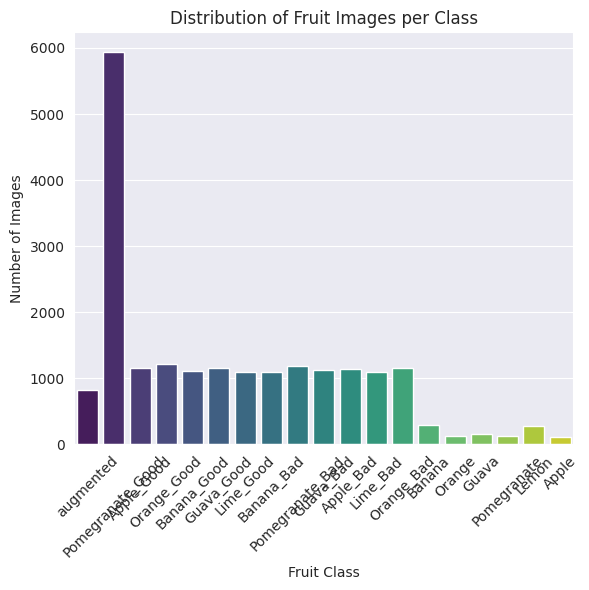

In [14]:
# Define source path
fruit_path = "combined_dataset"

# Create a list that stores data for each filenames, filepaths, and labels in the data
file_name = []
labels = []
full_path = []

# Get data image filenames, filepaths, labels one by one with looping, and store them as dataframe
valid_ext = ('.jpg', '.jpeg', '.png', '.jfif', '.bmp', '.webp')
for path, subdirs, files in os.walk(fruit_path):
    for name in files:
        if name.lower().endswith(valid_ext):
            full_path.append(os.path.join(path, name))
            labels.append(os.path.basename(path))  # ambil nama folder terakhir sebagai label
            file_name.append(name)

# Buat DataFrame dari hasil pembacaan
distribution_train = pd.DataFrame({
    "path": full_path,
    "file_name": file_name,
    "labels": labels
})

# Menampilkan jumlah total gambar dan kelas
print(f"Jumlah total gambar: {len(distribution_train)}")
print(f"Jumlah kelas: {distribution_train['labels'].nunique()}")
print("\nDistribusi gambar per kelas:")
print(distribution_train['labels'].value_counts())

# Plot the distribution of images across the classes
Label = distribution_train['labels']
plt.figure(figsize=(6,6))
sns.set_style("darkgrid")
plot_data = sns.countplot(x=Label, palette="viridis")
plt.title("Distribution of Fruit Images per Class")
plt.xlabel("Fruit Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#**Data Splitting : Training and Testing**

In [15]:
# Memanggil variabel mypath yang menampung folder dataset gambar
mypath= 'combined_dataset'

file_name = []
labels = []
full_path = []
#Looping untuk seluruh folder dan file
valid_ext = ('.jpg', '.jpeg', '.png', '.jfif', '.bmp', '.webp')
for path, subdirs, files in os.walk(mypath):
    for name in files:
         if name.lower().endswith(valid_ext):
            full_path.append(os.path.join(path, name))
            labels.append(path.split('/')[-1])
            file_name.append(name)


# Memasukan variabel yang sudah dikumpulkan pada looping di atas menjadi sebuah dataframe agar rapih
df = pd.DataFrame({"path":full_path,'file_name':file_name,"labels":labels})
# Melihat jumlah data gambar pada masing-masing label
df.groupby(['labels']).size()
print(f"Jumlah total gambar: {len(df)}")
print(f"Jumlah kelas: {df['labels'].nunique()}")
print("\nDistribusi gambar per kelas:")
print(df['labels'].value_counts())

Jumlah total gambar: 20340
Jumlah kelas: 19

Distribusi gambar per kelas:
labels
Pomegranate_Good    5940
Orange_Good         1216
Pomegranate_Bad     1187
Orange_Bad          1159
Guava_Good          1152
Apple_Good          1149
Apple_Bad           1141
Guava_Bad           1129
Banana_Good         1113
Lime_Good           1094
Banana_Bad          1087
Lime_Bad            1085
augmented            814
Banana               285
Lemon                278
Guava                148
Orange               125
Pomegranate          125
Apple                113
Name: count, dtype: int64


In [16]:
# PEMBAGIAN DATA (TRAIN : VALIDATION : TEST = 70 : 15 : 15)
X = df['path']
y = df['labels']

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=300
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=300
)

df_tr = pd.DataFrame({'path': X_train, 'labels': y_train, 'set': 'train'})
df_va = pd.DataFrame({'path': X_val, 'labels': y_val, 'set': 'val'})
df_te = pd.DataFrame({'path': X_test, 'labels': y_test, 'set': 'test'})
df_all = pd.concat([df_tr, df_va, df_te], ignore_index=True)

dataset_path = "Dataset-Final"
for index, row in tq(df_all.iterrows(), total=len(df_all), desc="Membuat folder dataset (train/val/test)"):
    file_path = row['path']
    dest_dir = os.path.join(dataset_path, row['set'], row['labels'])
    os.makedirs(dest_dir, exist_ok=True)
    shutil.copy2(file_path, dest_dir)


Membuat folder dataset (train/val/test):   0%|          | 0/20340 [00:00<?, ?it/s]

# **Image Data Generator**

In [17]:

# Normalisasi data training dan melakukan augmentasi


train_datagen = ImageDataGenerator(
    rescale=1./255,      # Normalisasi
    rotation_range=20,   # Augmentasi: rotasi
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,      # Augmentasi: zoom
    brightness_range=(0.9,1.1),
    horizontal_flip=True,# Augmentasi: flip horizontal
    fill_mode='nearest'
)

# Normalisasi data validation & test (tidak boleh diaugmentasi)
test_datagen = ImageDataGenerator(rescale=1./255)


# Membuat data generator dari folder (TRAINING)

train_generator = train_datagen.flow_from_directory(
    'Dataset-Final/train',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=True   # Mengacak urutan data training
)

# Membuat data generator dari folder (VALIDATION)

validation_generator = test_datagen.flow_from_directory(
    'Dataset-Final/val',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Data validasi tidak diacak
)


# Membuat data generator dari folder (TEST)

test_generator = test_datagen.flow_from_directory(
    'Dataset-Final/test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Data test tetap urut
)


# Menampilkan informasi dataset

print(f"Jumlah kelas terdeteksi: {train_generator.num_classes}")
print("Mapping kelas:", train_generator.class_indices)


Found 14238 images belonging to 19 classes.
Found 3051 images belonging to 19 classes.
Found 3051 images belonging to 19 classes.
Jumlah kelas terdeteksi: 19
Mapping kelas: {'Apple': 0, 'Apple_Bad': 1, 'Apple_Good': 2, 'Banana': 3, 'Banana_Bad': 4, 'Banana_Good': 5, 'Guava': 6, 'Guava_Bad': 7, 'Guava_Good': 8, 'Lemon': 9, 'Lime_Bad': 10, 'Lime_Good': 11, 'Orange': 12, 'Orange_Bad': 13, 'Orange_Good': 14, 'Pomegranate': 15, 'Pomegranate_Bad': 16, 'Pomegranate_Good': 17, 'augmented': 18}


# **Model CNN**

In [18]:

# MODEL CNN

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

model = Sequential([
    # Blok 1
    Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(150,150,3)),
    BatchNormalization(),
    Conv2D(32, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.25),

    # Blok 2
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.3),

    # Blok 3
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.4),

    # Blok 4
    Conv2D(256, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    Dropout(0.5),

    # Fully Connected Layer
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(train_generator.num_classes, activation='softmax')
])

# KOMPILASI MODEL

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Ringkasan arsitektur
model.summary()


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 18, 18, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 11,212,083 (42.77 MB)

 Trainable params: 11,210,675 (42.77 MB)

 Non-trainable params: 1,408 (5.50 KB)

In [19]:
callback = [
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        verbose=1
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor='val_accuracy',
        patience=10,
        restore_best_weights=True,
        verbose=1
    ),

    tf.keras.callbacks.ModelCheckpoint(
        filepath='best_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        save_weights_only=False,
        verbose=1
    )
]

In [20]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    callbacks=callback
)


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
445/445 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.3907 - loss: 4.5738
Epoch 1: val_accuracy improved from -inf to 0.29564, saving model to best_model.keras
445/445 ━━━━━━━━━━━━━━━━━━━━ 257s 527ms/step - accuracy: 0.3909 - loss: 4.5689 - val_accuracy: 0.2956 - val_loss: 5.5022 - learning_rate: 0.0010
Epoch 2/30
445/445 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step - accuracy: 0.5760 - loss: 1.4452
Epoch 2: val_accuracy improved from 0.29564 to 0.50279, saving model to best_model.keras
445/445 ━━━━━━━━━━━━━━━━━━━━ 197s 443ms/step - accuracy: 0.5761 - loss: 1.4451 - val_accuracy: 0.5028 - val_loss: 3.6327 - learning_rate: 0.0010
Epoch 3/30
445/445 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.6226 - loss: 1.2810
Epoch 3: val_accuracy improved from 0.50279 to 0.56867, saving model to best_model.keras
445/445 ━━━━━━━━━━━━━━━━━━━━ 217s 488ms/step - accuracy: 0.6226 - loss: 1.2808 - val_accuracy: 0.5687 - val_loss: 1.7516 - learning_rate: 0.0010
Epoch 4/30
445/445 ━━━━━━━━━━━━━━━━━━

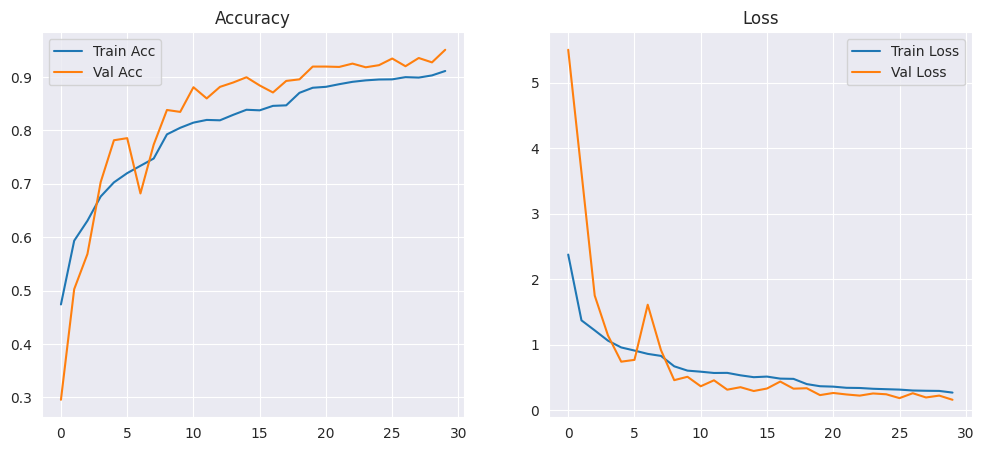

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss', 'learning_rate'])
Akurasi Training Terakhir: 91.14%
Akurasi Validasi Terakhir: 95.12%


In [21]:

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label="Train Acc")
plt.plot(history.history['val_accuracy'], label="Val Acc")
plt.legend(); plt.title("Accuracy")

plt.subplot(1,2,2)
plt.plot(history.history['loss'], label="Train Loss")
plt.plot(history.history['val_loss'], label="Val Loss")
plt.legend(); plt.title("Loss")

plt.show()

# Melihat seluruh history training
print(history.history.keys())

# Menampilkan akurasi terakhir
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
print(f"Akurasi Training Terakhir: {train_acc*100:.2f}%")
print(f"Akurasi Validasi Terakhir: {val_acc*100:.2f}%")



Evaluating model on test data...
96/96 ━━━━━━━━━━━━━━━━━━━━ 18s 192ms/step - accuracy: 0.9135 - loss: 0.2899

Hasil Evaluasi:
 - Test Loss     : 0.1793
 - Test Accuracy : 94.62%

Membuat prediksi pada data test...
96/96 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step

Classification Report:
                  precision    recall  f1-score   support

           Apple     1.0000    1.0000    1.0000        17
       Apple_Bad     0.9408    0.9298    0.9353       171
      Apple_Good     0.9122    0.7849    0.8438       172
          Banana     0.6863    0.8140    0.7447        43
      Banana_Bad     0.9752    0.9632    0.9691       163
     Banana_Good     0.9750    0.9341    0.9541       167
           Guava     0.7273    0.7273    0.7273        22
       Guava_Bad     0.9261    0.9645    0.9449       169
      Guava_Good     0.9075    0.9075    0.9075       173
           Lemon     0.8537    0.8537    0.8537        41
        Lime_Bad     0.9128    0.9632    0.9373       163
       Lime_Good     0

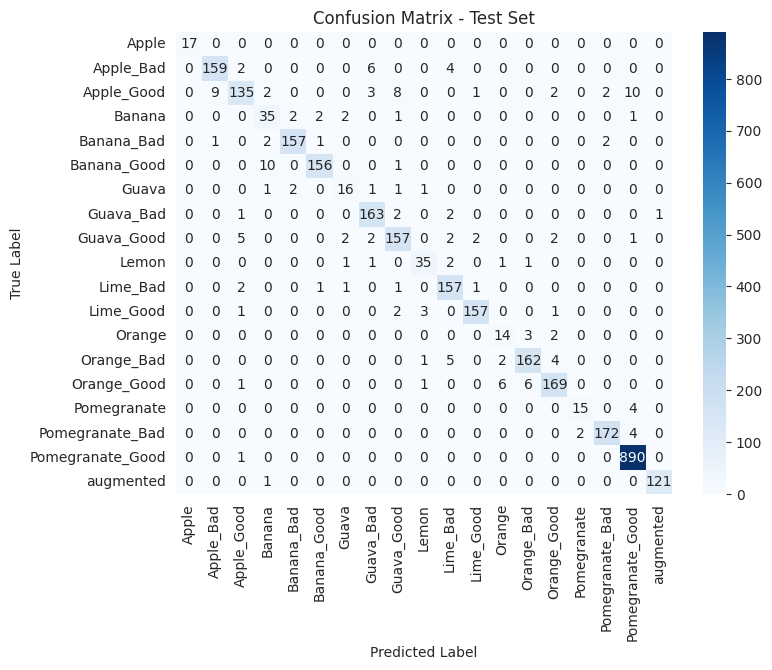

In [22]:

#  EVALUASI PADA DATA TEST

print("\nEvaluating model on test data...")
test_loss, test_acc = model.evaluate(test_generator, verbose=1)

print(f"\nHasil Evaluasi:")
print(f" - Test Loss     : {test_loss:.4f}")
print(f" - Test Accuracy : {test_acc*100:.2f}%")


#  PERFORMA TIAP KELAS

print("\nMembuat prediksi pada data test...")
y_prob = model.predict(test_generator, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = test_generator.classes

# Menambil label kelas dari generator
class_labels = list(test_generator.class_indices.keys())


# Laporan klasifikasi
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels, digits=4))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix - Test Set")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.show()


# **PENYIMPANAN MODEL DENGAN FORMAT BERBEDA**

In [23]:

# Format native baru (.keras) — direkomendasikan oleh TensorFlow
model.save("model_saved.keras")

# Format lama (.h5) — masih populer dan banyak digunakan
model.save("model_saved.h5")

# Format TensorFlow SavedModel (untuk TF-Lite, TFServing, TFJS, dll)
model.export("model_saved")  # <== Ganti model.save() menjadi model.export()


Saved artifact at 'model_saved'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 19), dtype=tf.float32, name=None)
Captures:
  138617330547792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581525712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581523792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581525904: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138617330546064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581526096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581526288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581526672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581521872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581527824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138616581527632: T

In [27]:


# Memastikan folder tujuan
Path("submission/tfjs_model").mkdir(parents=True, exist_ok=True)
Path("submission/tflite").mkdir(parents=True, exist_ok=True)

# MENGONVERSI KE TENSORFLOW.JS

print("\n Konversi model ke format TensorFlow.js ")

# Mengonversi langsung dari model Keras (.keras)
tfjs.converters.save_keras_model(model, "submission/tfjs_model")


print("Model berhasil dikonversi ke format TFJS.")


# MENGKONVERSI KE TFLITE
print("\nKonversi model ke format TFLite ")

# Mengambil dari SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("model_saved")

# converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

# Simpan hasil konversi
tflite_path = Path("submission/tflite/model.tflite")
with open(tflite_path, "wb") as f:
    f.write(tflite_model)

# Simpan label class
labels_path = Path("submission/tflite/label.txt")
class_labels = list(train_generator.class_indices.keys())
with open(labels_path, "w") as f:
    f.write("\n".join(class_labels))

print(f"Model berhasil dikonversi ke TFLite ({tflite_path})")


# VERIFIKASI SINGKAT

print("\nDaftar isi folder TFJS:")
!ls -R submission/tfjs_model

print("\nDaftar isi folder TFLite:")
!ls -R submission/tflite



 Konversi model ke format TensorFlow.js 
failed to lookup keras version from the file,
    this is likely a weight only file
Model berhasil dikonversi ke format TFJS.

Konversi model ke format TFLite 
Model berhasil dikonversi ke TFLite (submission/tflite/model.tflite)

Daftar isi folder TFJS:
submission/tfjs_model:
group1-shard10of11.bin	group1-shard3of11.bin  group1-shard7of11.bin
group1-shard11of11.bin	group1-shard4of11.bin  group1-shard8of11.bin
group1-shard1of11.bin	group1-shard5of11.bin  group1-shard9of11.bin
group1-shard2of11.bin	group1-shard6of11.bin  model.json

Daftar isi folder TFLite:
submission/tflite:
label.txt  model.tflite


In [29]:

# Membuat ZIP seluruh folder submission
shutil.make_archive("Submission_Malinny", "zip", "submission")

print("ZIP berhasil dibuat: Submission_Malinny.zip")


ZIP berhasil dibuat: Submission_Malinny.zip
